In [1]:
!nvidia-smi

Thu Mar  6 13:53:18 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 555.42.06              Driver Version: 555.42.06      CUDA Version: 12.5     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-80GB          On  |   00000000:41:00.0 Off |                    0 |
| N/A   25C    P0             58W /  500W |       1MiB /  81920MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [1]:
import os
import json
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from tqdm import tqdm

from transformers import (
    SwinModel,
    BartForConditionalGeneration,
    BartTokenizer,
)
from transformers.modeling_outputs import BaseModelOutput

###############################################
# Dataset
###############################################

class ImageCaptionDataset(Dataset):
    """
    Expects a JSONL file where each line is a JSON object with:
      - "image": filename of the image.
      - "suffix": the associated caption.
    """
    def __init__(self, jsonl_file, image_dir, transform=None):
        self.image_dir = image_dir
        self.transform = transform
        self.data = []
        with open(jsonl_file, 'r') as f:
            for line in f:
                record = json.loads(line)
                self.data.append(record)
    
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        record = self.data[idx]
        image_name = record["image"]
        caption = record["suffix"]
        image_path = os.path.join(self.image_dir, image_name)
        image = Image.open(image_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, caption

###############################################
# Collate Function
###############################################

def collate_fn(batch, tokenizer, max_length=50):
    """
    Collates a batch of (image, caption) tuples.
    Tokenizes captions using the provided tokenizer and pads them.
    """
    images = []
    captions = []
    for img, cap in batch:
        images.append(img)
        captions.append(cap)
    images = torch.stack(images, 0)
    # Tokenize and pad captions.
    captions_enc = tokenizer(
        captions, 
        padding=True, 
        truncation=True, 
        max_length=max_length, 
        return_tensors="pt"
    )
    # For BART, the labels (decoder targets) are the token ids.
    labels = captions_enc["input_ids"]
    return images, labels

###############################################
# Image Captioning Model: Swin + BART
###############################################

class ImageCaptioningModel(nn.Module):
    def __init__(self,
                 swin_model_name="microsoft/swin-base-patch4-window7-224",
                 bart_model_name="facebook/bart-base"):
        super().__init__()
        # Load the pretrained Swin Transformer.
        self.swin = SwinModel.from_pretrained(swin_model_name)
        # Load the pretrained BART model.
        self.bart = BartForConditionalGeneration.from_pretrained(bart_model_name)
        # Project Swin's hidden size to BART's hidden dimension.
        self.img_proj = nn.Linear(self.swin.config.hidden_size, self.bart.config.d_model)
    
    def forward(self, images, labels=None):
        # Extract image features using Swin.
        swin_outputs = self.swin(images)
        # Use the last hidden state as visual features.
        img_feats = swin_outputs.last_hidden_state  # shape: (batch, seq_len, swin_hidden_size)
        # Project features to match BART's d_model.
        img_feats_proj = self.img_proj(img_feats)     # shape: (batch, seq_len, bart_hidden_size)
        # Wrap projected features as encoder outputs.
        encoder_outputs = BaseModelOutput(last_hidden_state=img_feats_proj)
        if labels is not None:
            # When labels are provided, BART will compute the loss.
            outputs = self.bart(encoder_outputs=encoder_outputs, labels=labels)
        else:
            outputs = self.bart(encoder_outputs=encoder_outputs)
        return outputs

###############################################
# Validation Function
###############################################

def validate(model, dataloader, device):
    model.eval()  # Set model to evaluation mode
    total_loss = 0.0
    total_steps = 0

    with torch.no_grad():
        for images, labels in tqdm(dataloader):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images, labels=labels)
            loss = outputs.loss
            total_loss += loss.item()
            total_steps += 1

    avg_loss = total_loss / total_steps if total_steps > 0 else 0
    print(f"Validation Loss: {avg_loss:.4f}")
    return avg_loss

###############################################
# Training and Validation Loop
###############################################


def train_and_validate(model, train_loader, val_loader, optimizer, device, num_epochs, save_path='swin-bart-model.pth'):
    best_val_loss = float('inf')
    for epoch in range(num_epochs):
        model.train()
        for i, (images, labels) in enumerate(tqdm(train_loader, desc=f"Training Epoch {epoch+1}")):
            images = images.to(device)
            labels = labels.to(device)
            optimizer.zero_grad()
            outputs = model(images, labels=labels)
            loss = outputs.loss
            loss.backward()
            optimizer.step()
            if i % 100 == 0:
                print(f"Epoch [{epoch+1}/{num_epochs}], Step [{i}/{len(train_loader)}], Loss: {loss.item():.4f}")
        
        # Run validation after each epoch
        print(f"\nEpoch {epoch+1} completed. Running validation...")
        val_loss = validate(model, val_loader, device)
        print("-" * 50)
        
        generate_caption_for_random_image(model, val_img_dir, transform, tokenizer, device, max_length=516)
        
        # Save model if validation loss improves.
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            torch.save(model.state_dict(), save_path)
            print(f"New best model saved with validation loss: {best_val_loss:.4f}")

# def train_and_validate(model, train_loader, val_loader, optimizer, device, num_epochs):
#     for epoch in range(num_epochs):
#         model.train()
#         for i, (images, labels) in enumerate(tqdm(train_loader, desc=f"Training Epoch {epoch+1}")):
#             images = images.to(device)
#             labels = labels.to(device)
#             optimizer.zero_grad()
#             outputs = model(images, labels=labels)
#             loss = outputs.loss
#             loss.backward()
#             optimizer.step()
            
#             if i % 100 == 0:
#                 print(f"Epoch [{epoch+1}/{num_epochs}], Step [{i}/{len(train_loader)}], Loss: {loss.item():.4f}")
                
        
#         # Run validation after each epoch
#         generate_caption_for_random_image(model, val_img_dir, transform, tokenizer, device, max_length=50)
#         print(f"\nEpoch {epoch+1} completed. Running validation...")
#         validate(model, val_loader, device)
#         print("-" * 50)



/cluster/home/ammaa/.conda/envs/ammars/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-03-07 01:05:36.595302: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2025-03-07 01:05:43.288255: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-03-07 01:06:32.877188: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
import random
import os
import matplotlib.pyplot as plt

def generate_caption_for_random_image(model, image_dir, transform, tokenizer, device, max_length=50):
    """
    Randomly selects an image from image_dir, generates a caption using the model,
    and displays the image with the generated caption.
    """
    # List all image files in the directory (supports jpg, jpeg, png)
    image_files = [f for f in os.listdir(image_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if not image_files:
        print("No image files found in directory.")
        return

    # Randomly choose an image.
    random_image = random.choice(image_files)
    image_path = os.path.join(image_dir, random_image)
    image = Image.open(image_path).convert("RGB")

    # Preprocess the image.
    input_image = transform(image).unsqueeze(0).to(device)  # Add batch dimension.

    # Generate caption.
    model.eval()
    with torch.no_grad():
        # Extract features using the Swin encoder.
        swin_outputs = model.swin(input_image)
        img_feats = swin_outputs.last_hidden_state  # shape: (1, seq_len, swin_hidden_size)
        # Project features to BART's hidden dimension.
        img_feats_proj = model.img_proj(img_feats)     # shape: (1, seq_len, bart_hidden_size)
        # Wrap the projected features as encoder outputs.
        encoder_outputs = BaseModelOutput(last_hidden_state=img_feats_proj)
        # Use BART's generate method. Adjust generation parameters as needed.
        generated_ids = model.bart.generate(
            encoder_outputs=encoder_outputs,
            decoder_start_token_id=model.bart.config.decoder_start_token_id,
            max_length=max_length,
            num_beams=4,
            early_stopping=True
        )
        # Decode the generated ids to text.
        caption = tokenizer.decode(generated_ids[0], skip_special_tokens=True)

    # Display the image and generated caption.
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.axis('off')
    plt.title(caption)
    plt.show()

Training Epoch 1:   0%|          | 1/221 [00:17<1:04:21, 17.55s/it]

Epoch [1/10], Step [0/221], Loss: 15.5993


Training Epoch 1:  46%|████▌     | 101/221 [22:24<26:59, 13.49s/it]

Epoch [1/10], Step [100/221], Loss: 1.6714


Training Epoch 1:  91%|█████████ | 201/221 [44:50<04:39, 14.00s/it]

Epoch [1/10], Step [200/221], Loss: 1.4561


Training Epoch 1: 100%|██████████| 221/221 [49:15<00:00, 13.37s/it]



Epoch 1 completed. Running validation...


100%|██████████| 63/63 [12:30<00:00, 11.92s/it]


Validation Loss: 1.2840
--------------------------------------------------


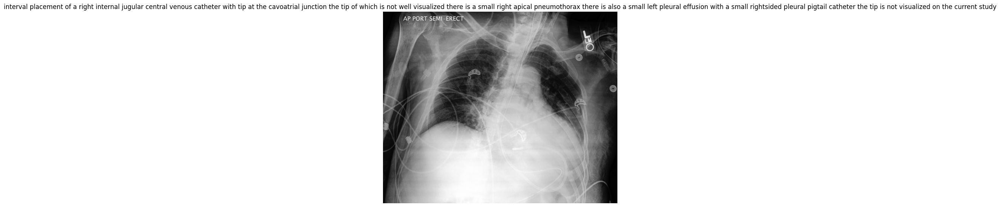

New best model saved with validation loss: 1.2840


Training Epoch 2:   0%|          | 1/221 [00:12<45:53, 12.52s/it]

Epoch [2/10], Step [0/221], Loss: 1.3430


Training Epoch 2:  46%|████▌     | 101/221 [25:24<30:31, 15.26s/it] 

Epoch [2/10], Step [100/221], Loss: 1.3808


Training Epoch 2:  91%|█████████ | 201/221 [51:12<05:16, 15.84s/it]

Epoch [2/10], Step [200/221], Loss: 1.3034


Training Epoch 2: 100%|██████████| 221/221 [56:16<00:00, 15.28s/it]



Epoch 2 completed. Running validation...


100%|██████████| 63/63 [15:10<00:00, 14.45s/it]


Validation Loss: 1.1751
--------------------------------------------------


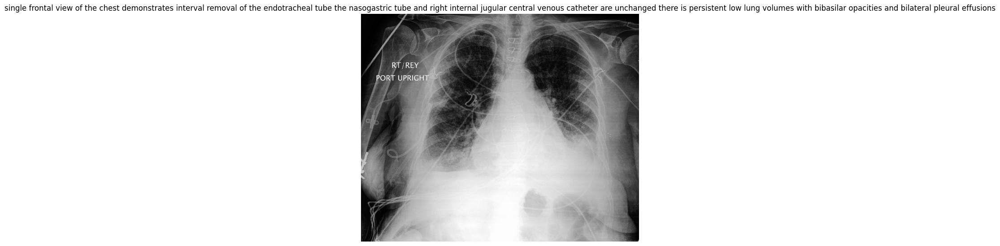

New best model saved with validation loss: 1.1751


Training Epoch 3:   0%|          | 1/221 [00:12<46:44, 12.75s/it]

Epoch [3/10], Step [0/221], Loss: 1.2793


Training Epoch 3:  46%|████▌     | 101/221 [22:09<28:03, 14.03s/it]

Epoch [3/10], Step [100/221], Loss: 1.1571


Training Epoch 3:  91%|█████████ | 201/221 [46:53<05:04, 15.25s/it]

Epoch [3/10], Step [200/221], Loss: 1.3663


Training Epoch 3: 100%|██████████| 221/221 [51:51<00:00, 14.08s/it]



Epoch 3 completed. Running validation...


100%|██████████| 63/63 [16:13<00:00, 15.45s/it]


Validation Loss: 1.6893
--------------------------------------------------


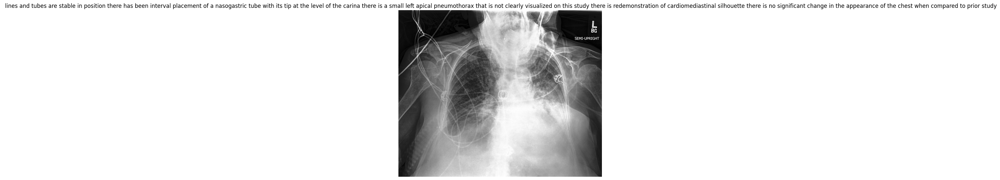

Training Epoch 4:   0%|          | 1/221 [00:14<52:53, 14.42s/it]

Epoch [4/10], Step [0/221], Loss: 2.7519


Training Epoch 4:  46%|████▌     | 101/221 [22:15<28:28, 14.24s/it]

Epoch [4/10], Step [100/221], Loss: 1.2286


Training Epoch 4:  91%|█████████ | 201/221 [47:16<05:30, 16.51s/it]

Epoch [4/10], Step [200/221], Loss: 1.1902


Training Epoch 4: 100%|██████████| 221/221 [52:28<00:00, 14.25s/it]



Epoch 4 completed. Running validation...


100%|██████████| 63/63 [16:20<00:00, 15.57s/it]


Validation Loss: 1.1050
--------------------------------------------------


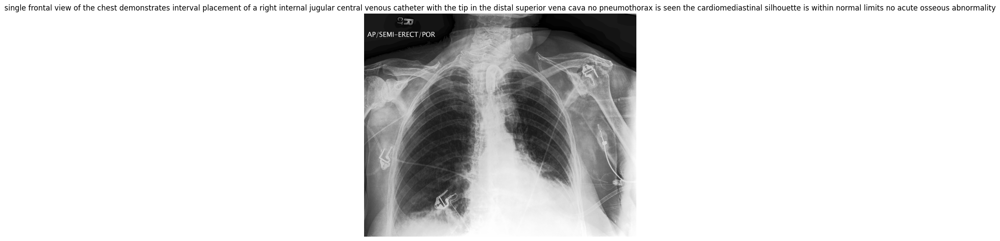

New best model saved with validation loss: 1.1050


Training Epoch 5:   0%|          | 1/221 [00:17<1:05:14, 17.79s/it]

Epoch [5/10], Step [0/221], Loss: 1.1479


Training Epoch 5:  46%|████▌     | 101/221 [23:25<29:24, 14.71s/it]

Epoch [5/10], Step [100/221], Loss: 1.1329


Training Epoch 5:  91%|█████████ | 201/221 [49:30<05:37, 16.87s/it]

Epoch [5/10], Step [200/221], Loss: 1.0730


Training Epoch 5: 100%|██████████| 221/221 [54:48<00:00, 14.88s/it]



Epoch 5 completed. Running validation...


100%|██████████| 63/63 [14:27<00:00, 13.77s/it]


Validation Loss: 1.0814
--------------------------------------------------


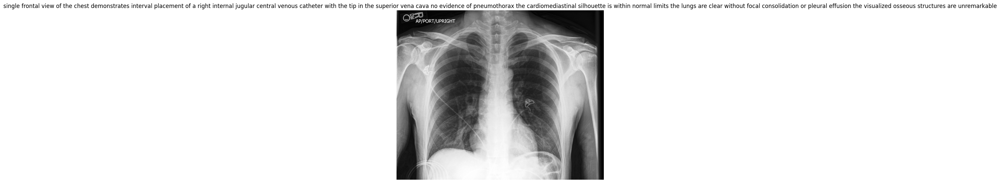

New best model saved with validation loss: 1.0814


Training Epoch 6:   0%|          | 1/221 [00:14<52:08, 14.22s/it]

Epoch [6/10], Step [0/221], Loss: 1.0623


Training Epoch 6:  46%|████▌     | 101/221 [22:35<28:05, 14.05s/it]

Epoch [6/10], Step [100/221], Loss: 1.0937


Training Epoch 6:  91%|█████████ | 201/221 [48:04<05:31, 16.59s/it]

Epoch [6/10], Step [200/221], Loss: 1.0771


Training Epoch 6: 100%|██████████| 221/221 [53:02<00:00, 14.40s/it]



Epoch 6 completed. Running validation...


100%|██████████| 63/63 [16:51<00:00, 16.05s/it]


Validation Loss: 1.0643
--------------------------------------------------


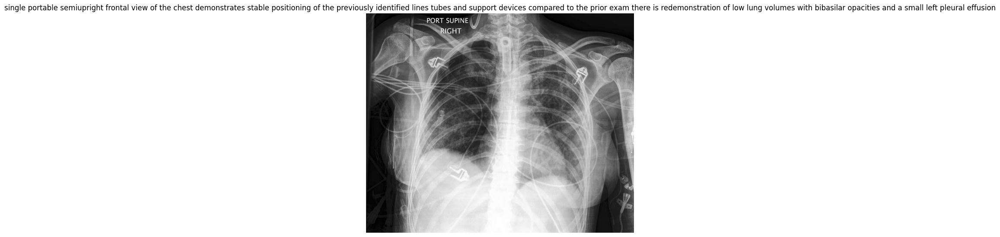

New best model saved with validation loss: 1.0643


Training Epoch 7:   0%|          | 1/221 [00:14<54:58, 14.99s/it]

Epoch [7/10], Step [0/221], Loss: 1.0538


Training Epoch 7:  46%|████▌     | 101/221 [22:36<28:06, 14.06s/it]

Epoch [7/10], Step [100/221], Loss: 1.0730


Training Epoch 7:  91%|█████████ | 201/221 [48:05<05:34, 16.74s/it]

Epoch [7/10], Step [200/221], Loss: 1.0870


Training Epoch 7: 100%|██████████| 221/221 [53:20<00:00, 14.48s/it]



Epoch 7 completed. Running validation...


100%|██████████| 63/63 [16:54<00:00, 16.10s/it]


Validation Loss: 1.0506
--------------------------------------------------


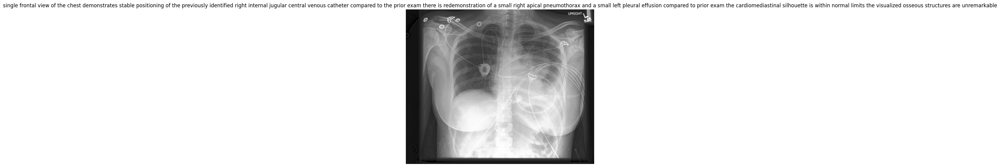

New best model saved with validation loss: 1.0506


Training Epoch 8:   0%|          | 1/221 [00:12<46:51, 12.78s/it]

Epoch [8/10], Step [0/221], Loss: 1.0786


Training Epoch 8:  46%|████▌     | 101/221 [23:27<31:04, 15.54s/it]

Epoch [8/10], Step [100/221], Loss: 1.0230


Training Epoch 8:  91%|█████████ | 201/221 [49:39<05:31, 16.59s/it]

Epoch [8/10], Step [200/221], Loss: 1.1064


Training Epoch 8: 100%|██████████| 221/221 [55:01<00:00, 14.94s/it]



Epoch 8 completed. Running validation...


100%|██████████| 63/63 [15:53<00:00, 15.14s/it]


Validation Loss: 1.0404
--------------------------------------------------


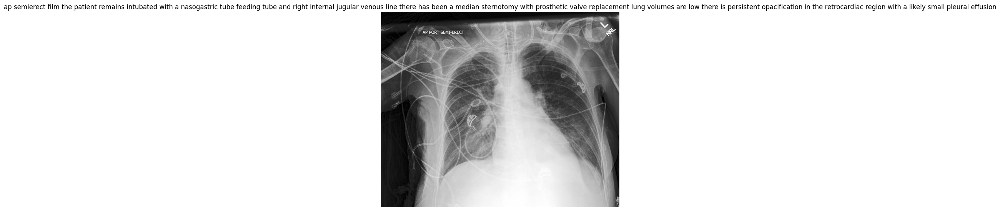

New best model saved with validation loss: 1.0404


Training Epoch 9:   0%|          | 1/221 [00:13<50:19, 13.72s/it]

Epoch [9/10], Step [0/221], Loss: 1.0464


Training Epoch 9:  46%|████▌     | 101/221 [23:25<29:43, 14.86s/it]

Epoch [9/10], Step [100/221], Loss: 1.0141


Training Epoch 9:  91%|█████████ | 201/221 [49:31<05:16, 15.84s/it]

Epoch [9/10], Step [200/221], Loss: 1.0313


Training Epoch 9: 100%|██████████| 221/221 [54:55<00:00, 14.91s/it]



Epoch 9 completed. Running validation...


100%|██████████| 63/63 [13:58<00:00, 13.30s/it]


Validation Loss: 1.0291
--------------------------------------------------


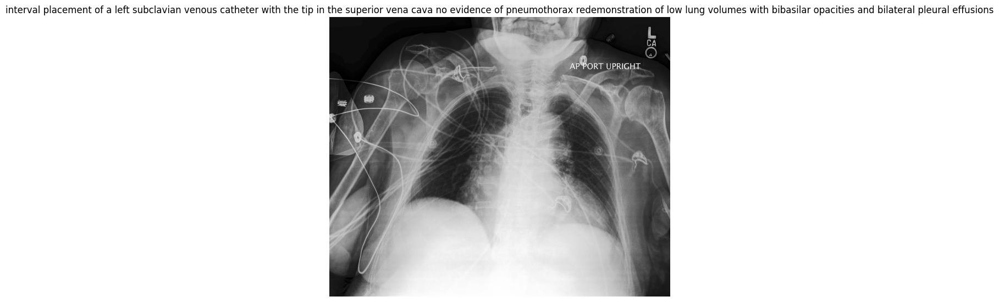

New best model saved with validation loss: 1.0291


Training Epoch 10:   0%|          | 1/221 [00:13<51:11, 13.96s/it]

Epoch [10/10], Step [0/221], Loss: 1.0235


Training Epoch 10:  46%|████▌     | 101/221 [22:58<29:20, 14.67s/it]

Epoch [10/10], Step [100/221], Loss: 1.0668


Training Epoch 10:  91%|█████████ | 201/221 [48:21<05:24, 16.23s/it]

Epoch [10/10], Step [200/221], Loss: 1.0514


Training Epoch 10: 100%|██████████| 221/221 [53:25<00:00, 14.51s/it]



Epoch 10 completed. Running validation...


100%|██████████| 63/63 [14:54<00:00, 14.20s/it]


Validation Loss: 1.0215
--------------------------------------------------


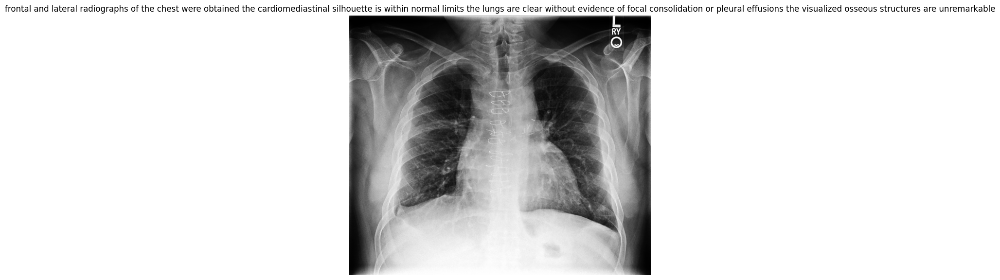

New best model saved with validation loss: 1.0215


In [3]:
###############################################
# Main: Data Preparation and Model Training in Jupyter
###############################################

# Set paths and parameters manually for Jupyter Notebook.
train_jsonl_path = '/cluster/home/ammaa/Downloads/Projects/CheXpert-Report-Generation/dataset_splits/train.jsonl'  # Path to your training JSONL file
val_jsonl_path = '/cluster/home/ammaa/Downloads/Projects/CheXpert-Report-Generation/dataset_splits/val.jsonl'      # Path to your validation JSONL file
train_img_dir = '/cluster/home/ammaa/Downloads/Projects/CheXpert-Report-Generation/dataset_splits/train'                   # Directory containing your image files
val_img_dir = '/cluster/home/ammaa/Downloads/Projects/CheXpert-Report-Generation/dataset_splits/val'                   # Directory containing your image files

batch_size = 128
num_epochs = 10
max_length = 100

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define image preprocessing.
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Load BART tokenizer.
tokenizer = BartTokenizer.from_pretrained("facebook/bart-base")

# Create training and validation datasets.
train_dataset = ImageCaptionDataset(train_jsonl_path, train_img_dir, transform=transform)
val_dataset = ImageCaptionDataset(val_jsonl_path, val_img_dir, transform=transform)

# Create DataLoaders for training and validation.
train_loader = DataLoader(
    train_dataset, 
    batch_size=batch_size, 
    shuffle=True, 
    collate_fn=lambda batch: collate_fn(batch, tokenizer, max_length=max_length)
)

val_loader = DataLoader(
    val_dataset, 
    batch_size=batch_size, 
    shuffle=False, 
    collate_fn=lambda batch: collate_fn(batch, tokenizer, max_length=max_length)
)

# Initialize the image captioning model.
model = ImageCaptioningModel().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)


# Start training with validation after each epoch.
train_and_validate(model, train_loader, val_loader, optimizer, device, num_epochs)

Training Epoch 1:   0%|          | 1/221 [00:34<2:04:42, 34.01s/it]

Epoch [1/40], Step [0/221], Loss: 0.9764


Training Epoch 1:  46%|████▌     | 101/221 [23:47<29:57, 14.98s/it]

Epoch [1/40], Step [100/221], Loss: 0.9662


Training Epoch 1:  91%|█████████ | 201/221 [48:13<05:21, 16.06s/it]

Epoch [1/40], Step [200/221], Loss: 1.0079


Training Epoch 1: 100%|██████████| 221/221 [53:20<00:00, 14.48s/it]



Epoch 1 completed. Running validation...


100%|██████████| 63/63 [13:04<00:00, 12.46s/it]


Validation Loss: 0.9952
--------------------------------------------------


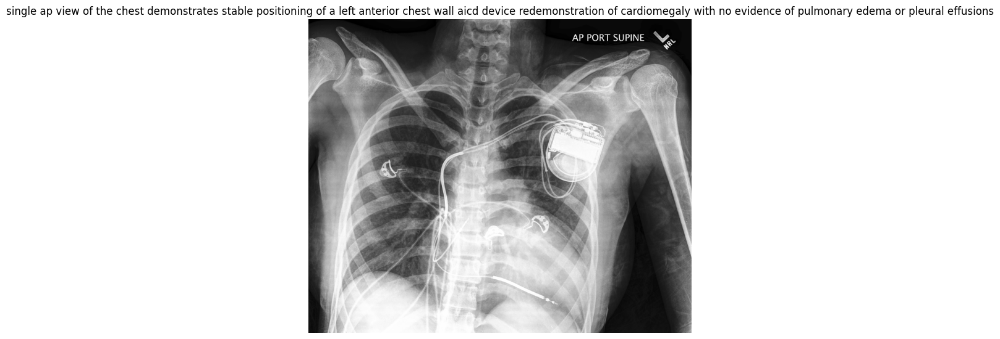

New best model saved with validation loss: 0.9952


Training Epoch 2:   0%|          | 1/221 [00:12<44:01, 12.01s/it]

Epoch [2/40], Step [0/221], Loss: 0.9641


Training Epoch 2:  46%|████▌     | 101/221 [20:49<28:00, 14.01s/it]

Epoch [2/40], Step [100/221], Loss: 0.8339


Training Epoch 2:  91%|█████████ | 201/221 [43:11<05:23, 16.16s/it]

Epoch [2/40], Step [200/221], Loss: 0.8792


Training Epoch 2: 100%|██████████| 221/221 [47:51<00:00, 12.99s/it]



Epoch 2 completed. Running validation...


100%|██████████| 63/63 [09:29<00:00,  9.04s/it]


Validation Loss: 0.9999
--------------------------------------------------


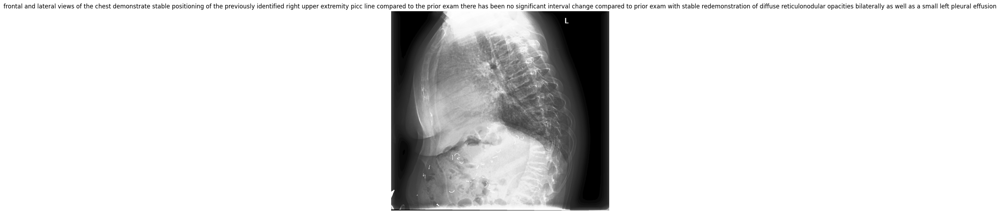

Training Epoch 3:   0%|          | 1/221 [00:10<38:31, 10.50s/it]

Epoch [3/40], Step [0/221], Loss: 0.9747


Training Epoch 3:  46%|████▌     | 101/221 [21:42<27:55, 13.96s/it]

Epoch [3/40], Step [100/221], Loss: 0.9381


Training Epoch 3:  91%|█████████ | 201/221 [43:10<04:35, 13.79s/it]

Epoch [3/40], Step [200/221], Loss: 0.8762


Training Epoch 3: 100%|██████████| 221/221 [47:32<00:00, 12.91s/it]



Epoch 3 completed. Running validation...


100%|██████████| 63/63 [09:42<00:00,  9.24s/it]


Validation Loss: 0.9897
--------------------------------------------------


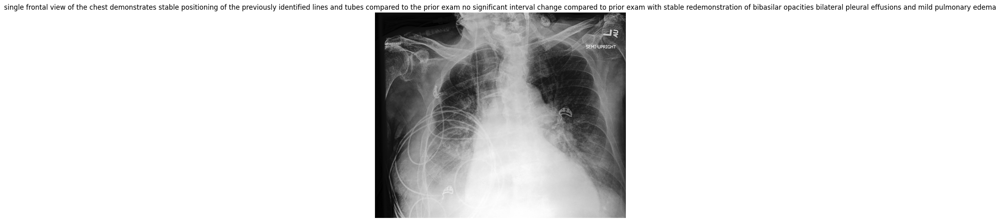

New best model saved with validation loss: 0.9897


Training Epoch 4:   0%|          | 1/221 [00:10<39:01, 10.64s/it]

Epoch [4/40], Step [0/221], Loss: 0.9257


Training Epoch 4:  46%|████▌     | 101/221 [19:59<23:25, 11.71s/it]

Epoch [4/40], Step [100/221], Loss: 0.8595


Training Epoch 4:  91%|█████████ | 201/221 [42:05<04:58, 14.91s/it]

Epoch [4/40], Step [200/221], Loss: 0.8730


Training Epoch 4: 100%|██████████| 221/221 [46:24<00:00, 12.60s/it]



Epoch 4 completed. Running validation...


100%|██████████| 63/63 [09:52<00:00,  9.40s/it]


Validation Loss: 0.9836
--------------------------------------------------


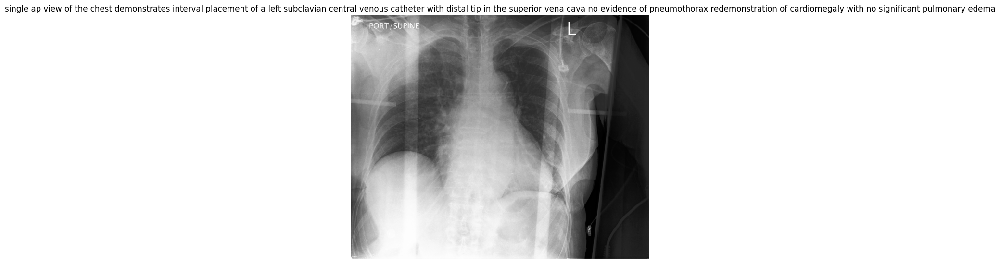

New best model saved with validation loss: 0.9836


Training Epoch 5:   0%|          | 1/221 [00:10<37:19, 10.18s/it]

Epoch [5/40], Step [0/221], Loss: 0.8453


Training Epoch 5:  46%|████▌     | 101/221 [17:20<20:38, 10.32s/it]

Epoch [5/40], Step [100/221], Loss: 0.8830


Training Epoch 5:  91%|█████████ | 201/221 [36:47<04:13, 12.66s/it]

Epoch [5/40], Step [200/221], Loss: 0.7991


Training Epoch 5: 100%|██████████| 221/221 [41:03<00:00, 11.15s/it]



Epoch 5 completed. Running validation...


100%|██████████| 63/63 [10:15<00:00,  9.76s/it]


Validation Loss: 0.9831
--------------------------------------------------


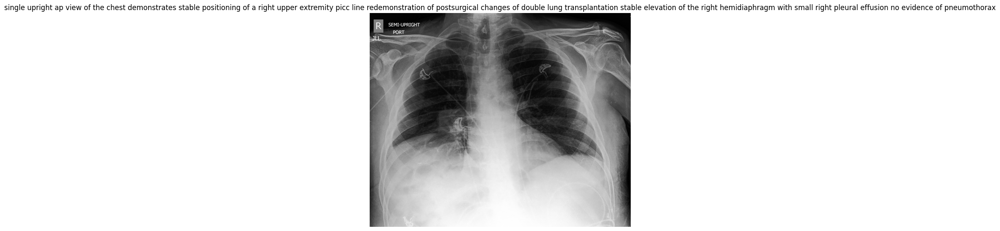

New best model saved with validation loss: 0.9831


Training Epoch 6:   0%|          | 1/221 [00:10<37:58, 10.36s/it]

Epoch [6/40], Step [0/221], Loss: 0.8501


Training Epoch 6:  46%|████▌     | 101/221 [17:10<22:55, 11.47s/it]

Epoch [6/40], Step [100/221], Loss: 0.8309


Training Epoch 6:  91%|█████████ | 201/221 [37:02<04:17, 12.86s/it]

Epoch [6/40], Step [200/221], Loss: 0.8764


Training Epoch 6: 100%|██████████| 221/221 [41:17<00:00, 11.21s/it]



Epoch 6 completed. Running validation...


100%|██████████| 63/63 [10:13<00:00,  9.74s/it]


Validation Loss: 0.9880
--------------------------------------------------


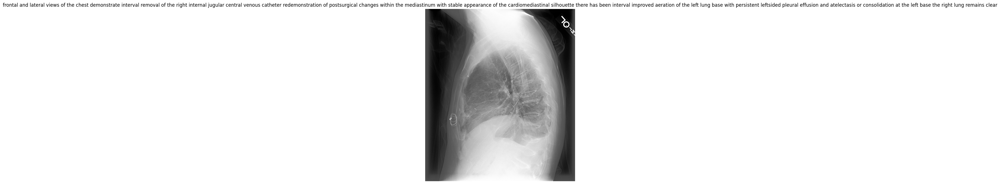

Training Epoch 7:   0%|          | 1/221 [00:09<36:03,  9.83s/it]

Epoch [7/40], Step [0/221], Loss: 0.8432


Training Epoch 7:  46%|████▌     | 101/221 [15:36<19:45,  9.88s/it]

Epoch [7/40], Step [100/221], Loss: 0.7943


Training Epoch 7:  91%|█████████ | 201/221 [33:02<03:48, 11.45s/it]

Epoch [7/40], Step [200/221], Loss: 0.8238


Training Epoch 7: 100%|██████████| 221/221 [36:48<00:00,  9.99s/it]



Epoch 7 completed. Running validation...


100%|██████████| 63/63 [08:51<00:00,  8.43s/it]


Validation Loss: 0.9980
--------------------------------------------------


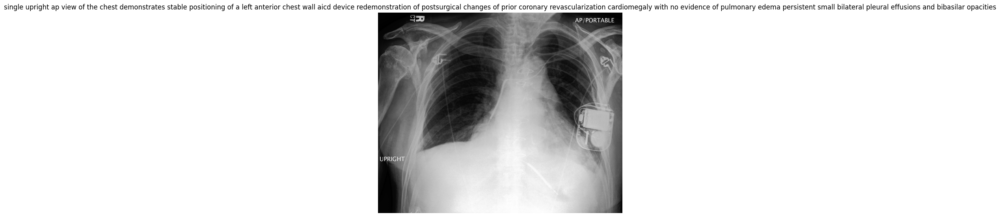

Training Epoch 8:   0%|          | 1/221 [00:09<36:02,  9.83s/it]

Epoch [8/40], Step [0/221], Loss: 0.7223


Training Epoch 8:  46%|████▌     | 101/221 [15:43<19:26,  9.72s/it]

Epoch [8/40], Step [100/221], Loss: 0.7331


Training Epoch 8:  91%|█████████ | 201/221 [32:54<03:38, 10.93s/it]

Epoch [8/40], Step [200/221], Loss: 0.7748


Training Epoch 8: 100%|██████████| 221/221 [36:30<00:00,  9.91s/it]



Epoch 8 completed. Running validation...


100%|██████████| 63/63 [09:32<00:00,  9.08s/it]


Validation Loss: 1.0105
--------------------------------------------------


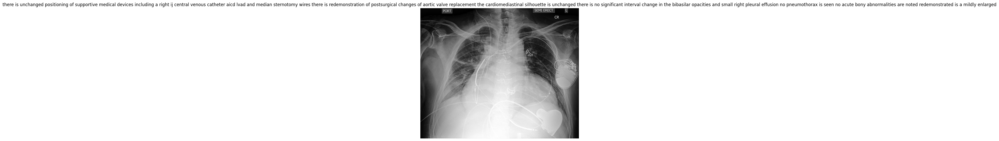

Training Epoch 9:   0%|          | 1/221 [00:09<35:45,  9.75s/it]

Epoch [9/40], Step [0/221], Loss: 0.7332


Training Epoch 9:  46%|████▌     | 101/221 [16:30<19:59, 10.00s/it]

Epoch [9/40], Step [100/221], Loss: 0.7354


Training Epoch 9:  91%|█████████ | 201/221 [35:42<03:51, 11.59s/it]

Epoch [9/40], Step [200/221], Loss: 0.7910


Training Epoch 9: 100%|██████████| 221/221 [39:34<00:00, 10.75s/it]



Epoch 9 completed. Running validation...


100%|██████████| 63/63 [09:33<00:00,  9.10s/it]


Validation Loss: 1.0259
--------------------------------------------------


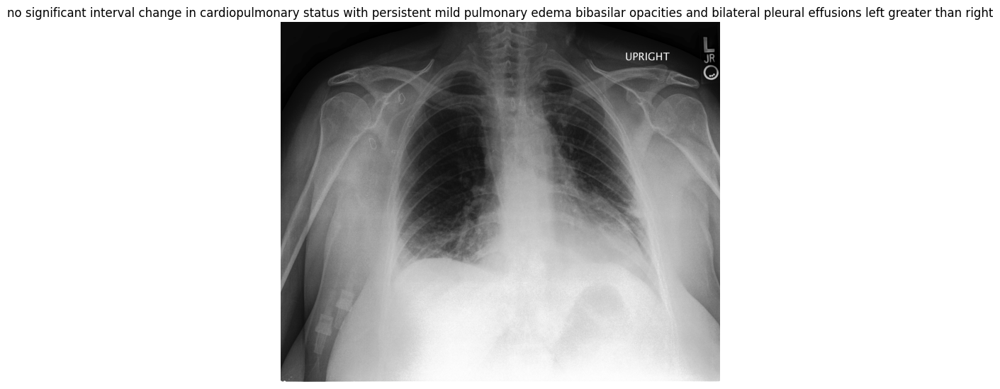

Training Epoch 10:   0%|          | 1/221 [00:09<33:56,  9.26s/it]

Epoch [10/40], Step [0/221], Loss: 0.6927


Training Epoch 10:  46%|████▌     | 101/221 [15:46<19:24,  9.70s/it]

Epoch [10/40], Step [100/221], Loss: 0.7201


Training Epoch 10:  91%|█████████ | 201/221 [34:39<03:54, 11.71s/it]

Epoch [10/40], Step [200/221], Loss: 0.6675


Training Epoch 10: 100%|██████████| 221/221 [38:44<00:00, 10.52s/it]



Epoch 10 completed. Running validation...


100%|██████████| 63/63 [10:55<00:00, 10.41s/it]


Validation Loss: 1.0315
--------------------------------------------------


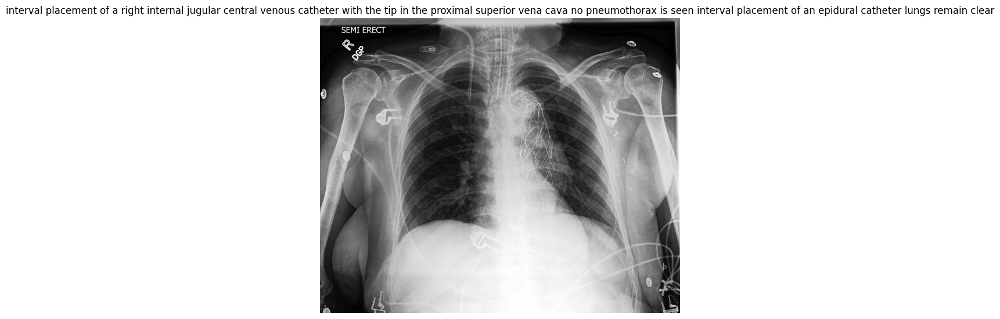

Training Epoch 11:   0%|          | 1/221 [00:10<38:20, 10.46s/it]

Epoch [11/40], Step [0/221], Loss: 0.6195


Training Epoch 11:  46%|████▌     | 101/221 [17:06<20:56, 10.47s/it]

Epoch [11/40], Step [100/221], Loss: 0.6933


Training Epoch 11:  91%|█████████ | 201/221 [37:01<04:26, 13.34s/it]

Epoch [11/40], Step [200/221], Loss: 0.7054


Training Epoch 11: 100%|██████████| 221/221 [41:33<00:00, 11.28s/it]



Epoch 11 completed. Running validation...


100%|██████████| 63/63 [10:17<00:00,  9.80s/it]


Validation Loss: 1.0619
--------------------------------------------------


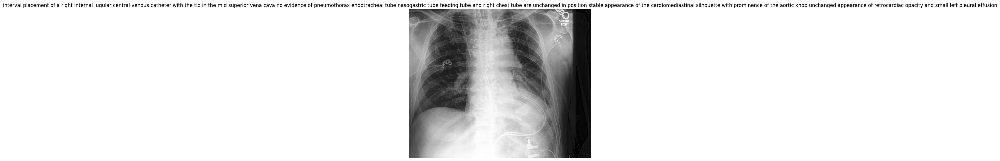

Training Epoch 12:   0%|          | 1/221 [00:09<34:11,  9.33s/it]

Epoch [12/40], Step [0/221], Loss: 0.6037


Training Epoch 12:  46%|████▌     | 101/221 [17:31<23:54, 11.95s/it]

Epoch [12/40], Step [100/221], Loss: 0.5932


Training Epoch 12:  91%|█████████ | 201/221 [38:13<04:18, 12.93s/it]

Epoch [12/40], Step [200/221], Loss: 0.6138


Training Epoch 12: 100%|██████████| 221/221 [42:19<00:00, 11.49s/it]



Epoch 12 completed. Running validation...


100%|██████████| 63/63 [11:06<00:00, 10.58s/it]


Validation Loss: 1.0953
--------------------------------------------------


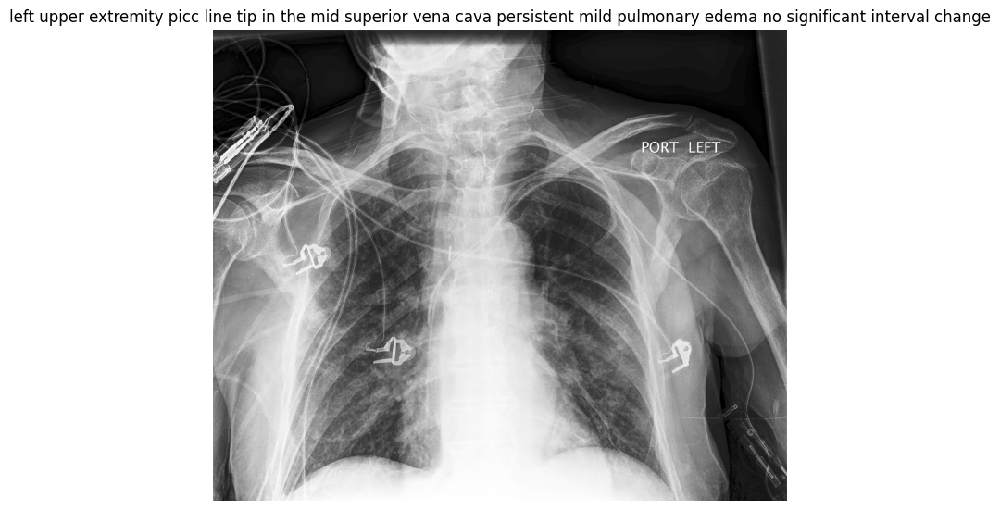

Training Epoch 13:   0%|          | 1/221 [00:10<38:11, 10.42s/it]

Epoch [13/40], Step [0/221], Loss: 0.5589


Training Epoch 13:  46%|████▌     | 101/221 [22:14<36:13, 18.11s/it]

Epoch [13/40], Step [100/221], Loss: 0.6346


Training Epoch 13:  53%|█████▎    | 118/221 [25:51<22:26, 13.07s/it]

In [4]:

# Set paths and parameters manually for Jupyter Notebook.
train_jsonl_path = '/cluster/home/ammaa/Downloads/Projects/CheXpert-Report-Generation/dataset_splits/train.jsonl'  # Path to your training JSONL file
val_jsonl_path = '/cluster/home/ammaa/Downloads/Projects/CheXpert-Report-Generation/dataset_splits/val.jsonl'      # Path to your validation JSONL file
train_img_dir = '/cluster/home/ammaa/Downloads/Projects/CheXpert-Report-Generation/dataset_splits/train'                   # Directory containing your image files
val_img_dir = '/cluster/home/ammaa/Downloads/Projects/CheXpert-Report-Generation/dataset_splits/val'                   # Directory containing your image files

batch_size = 128
num_epochs = 10
max_length = 100

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define image preprocessing.
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Load BART tokenizer.
tokenizer = BartTokenizer.from_pretrained("facebook/bart-base")

# Create training and validation datasets.
train_dataset = ImageCaptionDataset(train_jsonl_path, train_img_dir, transform=transform)
val_dataset = ImageCaptionDataset(val_jsonl_path, val_img_dir, transform=transform)

# Create DataLoaders for training and validation.
train_loader = DataLoader(
    train_dataset, 
    batch_size=batch_size, 
    shuffle=True, 
    collate_fn=lambda batch: collate_fn(batch, tokenizer, max_length=max_length)
)

val_loader = DataLoader(
    val_dataset, 
    batch_size=batch_size, 
    shuffle=False, 
    collate_fn=lambda batch: collate_fn(batch, tokenizer, max_length=max_length)
)

# Initialize the image captioning model.
model = ImageCaptioningModel().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

model.load_state_dict(torch.load('swin-bart-model.pth', map_location=device))
# Start training with validation after each epoch.
train_and_validate(model, train_loader, val_loader, optimizer, device, 40)

### Load model

In [3]:
# Create the model architecture instance.
# model = ImageCaptioningModel().to(device)

# Load the saved model state.
model.load_state_dict(torch.load('swin-bart-model.pth', map_location=device))

# Set the model to evaluation mode.
model.eval()

NameError: name 'model' is not defined

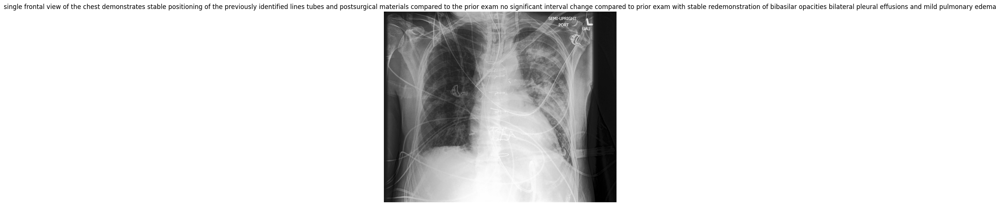

In [32]:
generate_caption_for_random_image(model, val_img_dir, transform, tokenizer, device, max_length=516)

In [ ]:
from nlgeval import NLGEval
from tqdm import tqdm
from transformers.modeling_outputs import BaseModelOutput

def evaluate_test_set(model, test_dataset, tokenizer, device, max_length=50):
    """
    Evaluates the model on the test dataset by generating captions for each image and
    computing evaluation metrics using nlgeval.
    
    Args:
        model: The trained ImageCaptioningModel.
        test_dataset: An instance of ImageCaptionDataset for the test set.
        tokenizer: The BartTokenizer used for decoding.
        device: torch.device to run inference on.
        max_length: Maximum length of generated captions.
    
    Returns:
        metrics_dict: A dictionary with evaluation metrics.
    """
    model.eval()
    references = []   # List of lists; each inner list contains one or more reference captions
    hypotheses = []   # List of generated captions

    # Iterate over the test dataset
    for i in tqdm(range(len(test_dataset)), desc="Evaluating Test Set"):
        # Get the image and its ground truth caption
        image, gt_caption = test_dataset[i]
        # Ensure image is a batch (add batch dimension) and send to device.
        image = image.unsqueeze(0).to(device)

        with torch.no_grad():
            # Extract image features using the Swin encoder.
            swin_outputs = model.swin(image)
            img_feats = swin_outputs.last_hidden_state
            # Project features to BART's hidden dimension.
            img_feats_proj = model.img_proj(img_feats)
            # Wrap projected features as encoder outputs.
            encoder_outputs = BaseModelOutput(last_hidden_state=img_feats_proj)
            # Generate caption using BART's generate method.
            generated_ids = model.bart.generate(
                encoder_outputs=encoder_outputs,
                decoder_start_token_id=model.bart.config.decoder_start_token_id,
                max_length=max_length,
                num_beams=4,
                early_stopping=True
            )
            # Decode the generated ids to text.
            caption = tokenizer.decode(generated_ids[0], skip_special_tokens=True)
        
        # Append the generated caption and its corresponding ground truth caption.
        hypotheses.append(caption)
        references.append([gt_caption])  # List within a list allows for multiple refs per image if needed

    # Initialize NLGEval, which computes BLEU, METEOR, ROUGE-L, CIDEr, and SPICE.
    nlgeval = NLGEval()
    metrics_dict = nlgeval.compute_metrics(references, hypotheses)
    
    print("Evaluation Metrics on Test Set:")
    for metric, score in metrics_dict.items():
        print(f"{metric}: {score:.4f}")
    
    return metrics_dict

# Example usage:
# Define the paths to your test JSONL file and images directory.
test_jsonl_path = '/cluster/home/ammaa/Downloads/Projects/CheXpert-Report-Generation/dataset_splits/test.jsonl'
test_img_dir = '/cluster/home/ammaa/Downloads/Projects/CheXpert-Report-Generation/dataset_splits/test'

# Create the test dataset.
test_dataset = ImageCaptionDataset(test_jsonl_path, test_img_dir, transform=transform)

# Evaluate on the test set.
evaluate_test_set(model, test_dataset, tokenizer, device, max_length=100)

In [ ]:
!pip install evaluate
!pip install rouge_score

In [20]:
import evaluate
from tqdm import tqdm
from transformers.modeling_outputs import BaseModelOutput

def evaluate_test_set(model, test_dataset, tokenizer, device, max_length=50):
    """
    Evaluates the model on the test dataset by generating captions for each image and
    computing evaluation metrics using Hugging Face's evaluate package.

    Args:
        model: The trained ImageCaptioningModel.
        test_dataset: An instance of ImageCaptionDataset for the test set.
        tokenizer: The BartTokenizer used for decoding.
        device: torch.device to run inference on.
        max_length: Maximum length of generated captions.

    Returns:
        A dictionary with BLEU, ROUGE, and METEOR metrics.
    """
    model.eval()
    references = []   # List of lists: each inner list contains one reference caption per image
    hypotheses = []   # List of generated captions

    # Loop over the test set
    for i in tqdm(range(len(test_dataset)), desc="Evaluating Test Set"):
        image, gt_caption = test_dataset[i]
        image = image.unsqueeze(0).to(device)  # Add batch dimension

        with torch.no_grad():
            # Extract image features using the Swin encoder.
            swin_outputs = model.swin(image)
            img_feats = swin_outputs.last_hidden_state
            # Project features to BART's hidden dimension.
            img_feats_proj = model.img_proj(img_feats)
            # Wrap projected features as encoder outputs.
            encoder_outputs = BaseModelOutput(last_hidden_state=img_feats_proj)
            # Generate caption using BART's generate method.
            generated_ids = model.bart.generate(
                encoder_outputs=encoder_outputs,
                decoder_start_token_id=model.bart.config.decoder_start_token_id,
                max_length=max_length,
                num_beams=4,
                early_stopping=True
            )
            caption = tokenizer.decode(generated_ids[0], skip_special_tokens=True)

        
        hypotheses.append(caption)
        references.append([gt_caption])  # Wrap in a list to allow for multiple references if needed

    # Initialize evaluation metrics from Hugging Face Evaluate.
    bleu = evaluate.load("bleu")
    rouge = evaluate.load("rouge")
    meteor = evaluate.load("meteor")

    # Compute metrics. For BLEU, the references should be a list of lists.
    results_bleu = bleu.compute(predictions=hypotheses, references=references)
    results_rouge = rouge.compute(predictions=hypotheses, references=references)
    results_meteor = meteor.compute(predictions=hypotheses, references=references)

    print("BLEU:", results_bleu)
    print("ROUGE:", results_rouge)
    print("METEOR:", results_meteor)

    return {"BLEU": results_bleu, "ROUGE": results_rouge, "METEOR": results_meteor}

# Example usage:
test_jsonl_path = '/cluster/home/ammaa/Downloads/Projects/CheXpert-Report-Generation/dataset_splits/test.jsonl'
test_img_dir = '/cluster/home/ammaa/Downloads/Projects/CheXpert-Report-Generation/dataset_splits/test'

# Create the test dataset.
test_dataset = ImageCaptionDataset(test_jsonl_path, test_img_dir, transform=transform)

# Evaluate on the test set.
metrics = evaluate_test_set(model, test_dataset, tokenizer, device, max_length=100)

Evaluating Test Set:   0%|          | 0/4026 [00:00<?, ?it/s]

Evaluating Test Set: 100%|██████████| 4026/4026 [28:54<00:00,  2.32it/s]
[nltk_data] Downloading package wordnet to
[nltk_data]     /cluster/home/ammaa/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     /cluster/home/ammaa/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     /cluster/home/ammaa/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


BLEU: {'bleu': 0.04849327542356112, 'precisions': [0.288244965989459, 0.08331124759457498, 0.03408045299044473, 0.01668741012844835], 'brevity_penalty': 0.7977036919143521, 'length_ratio': 0.8156486673923328, 'translation_length': 177592, 'reference_length': 217731}
ROUGE: {'rouge1': 0.2614085462491933, 'rouge2': 0.07548699238873413, 'rougeL': 0.18367480658857183, 'rougeLsum': 0.18361265098256496}
METEOR: {'meteor': 0.21182193407652006}


In [ ]:
metrics = evaluate_test_set(model, val_dataset, tokenizer, device, max_length=100)

### Inference

In [3]:
max_length = 100

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define image preprocessing.
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Load BART tokenizer.
tokenizer = BartTokenizer.from_pretrained("facebook/bart-base")

# Initialize the image captioning model.
model = ImageCaptioningModel().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

model.load_state_dict(torch.load('swin-bart-model.pth', map_location=device))

<All keys matched successfully>

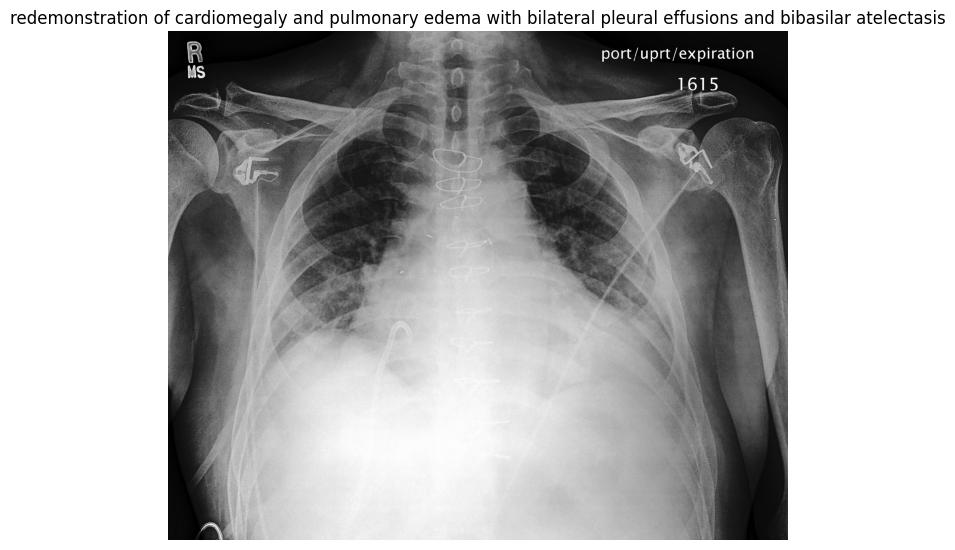

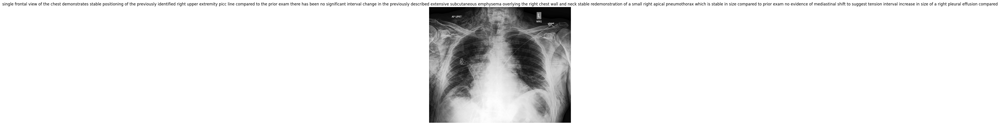

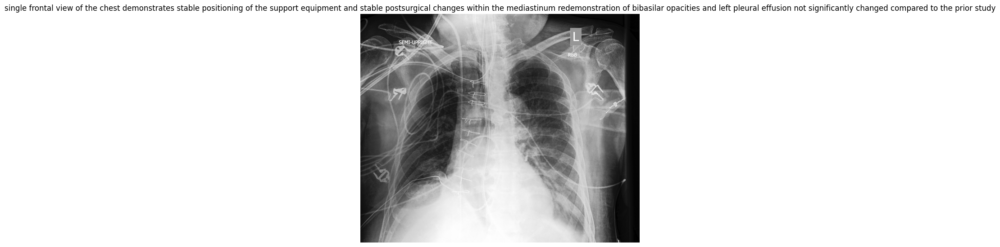

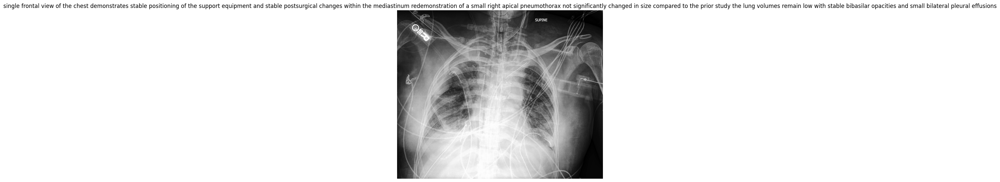

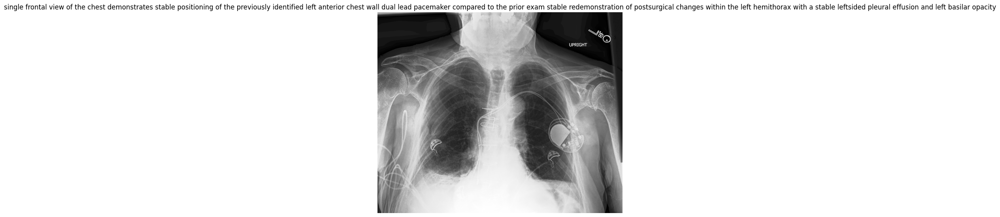

In [15]:
val_img_dir = '/cluster/home/ammaa/Downloads/Projects/CheXpert-Report-Generation/dataset_splits/test'
num_imgs = 5

for i in range(num_imgs):
    generate_caption_for_random_image(model, val_img_dir, transform, tokenizer, device, max_length=max_length)